<a href="https://colab.research.google.com/github/sohailpk84-max/pakgeek/blob/main/MSCS1126.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import output
output.eval_js('document.body.style.backgroundColor = "white";')

'white'

In [ ]:
!pip install xgboost==1.7.6 scikit-learn==1.2.2

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import (
    RandomForestClassifier,
    BaggingClassifier,
    GradientBoostingClassifier,
    AdaBoostClassifier,
    StackingClassifier,
)
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    confusion_matrix,
    ConfusionMatrixDisplay,
)
from sklearn.base import clone
from sklearn.preprocessing import LabelEncoder
from tabulate import tabulate
import warnings




warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

# Load the dataset
file_path = "/content/data_synth_balanced10kk.csv"
data = pd.read_csv(file_path)
data.head(10)

,id,age,bp,sg,al,su,rbc,pc,pcc,ba,...,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
0,61,NaN,56.518561,1.016291,0.000000,1.923205,abnormal,normal,notpresent,present,...,53,9900,NaN,no,yes,no,poor,yes,no,ckd
1,217,80.878548,68.241754,1.018162,2.526173,1.908239,normal,NaN,notpresent,notpresent,...,20,NaN,NaN,no,\tyes,\tno,poor,yes,no,ckd
2,399,82.263925,64.334385,1.005000,4.125700,0.000000,normal,normal,notpresent,notpresent,...,32,7200,NaN,yes,no,no,good,no,no,ckd
3,286,62.463738,58.166452,1.008420,0.833084,3.640488,abnormal,abnormal,present,notpresent,...,40,NaN,NaN,no,no,no,good,yes,no,ckd
4,16,69.638772,89.979287,1.016896,3.147144,0.133488,normal,abnormal,notpresent,present,...,24,8800,6,no,no,yes,good,yes,yes,ckd
5,0,59.369075,58.388820,1.021201,NaN,NaN,abnormal,abnormal,present,present,...,48,2200,2.4,yes,yes,yes,good,yes,yes,ckd
6,0,87.606515,83.626251,1.025000,0.677006,0.135100,NaN,normal,notpresent,notpresent,...,47,2600,NaN,no,no,no,good,no,no,ckd
7,181,73.532674,69.190390,1.011522,1.212010,0.088251,abnormal,abnormal,notpresent,notpresent,...,35,NaN,5.2,no,yes,no,good,no,no,ckd
8,92,67.838317,64.661602,1.010151,4.576284,0.057552,NaN,abnormal,present,notpresent,...,31,7500,5.2,yes,no,no,good,no,yes,ckd
9,0,76.515996,60.510583,1.016912,1.336594,0.000000,normal,normal,notpresent,notpresent,...,NaN,6700,5.2,yes,yes,no,good,yes,no,ckd


In [ ]:
data.shape

(10000, 26)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 26 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              10000 non-null  int64  
 1   age             9775 non-null   float64
 2   bp              9700 non-null   float64
 3   sg              8825 non-null   float64
 4   al              8850 non-null   float64
 5   su              8775 non-null   float64
 6   rbc             6200 non-null   object 
 7   pc              8375 non-null   object 
 8   pcc             9900 non-null   object 
 9   ba              9900 non-null   object 
 10  bgr             8900 non-null   float64
 11  bu              9525 non-null   float64
 12  sc              9575 non-null   float64
 13  sod             7825 non-null   float64
 14  pot             7800 non-null   float64
 15  hemo            8700 non-null   float64
 16  pcv             8250 non-null   object 
 17  wc              7375 non-null   

In [ ]:
numeric_cols = data.select_dtypes(include=['float64', 'int64']).columns
data[numeric_cols] = data[numeric_cols].apply(lambda x: x.fillna(x.mean()))

In [ ]:
categorical_cols = data.select_dtypes(include=['object']).columns
data[categorical_cols] = data[categorical_cols].apply(lambda x: x.fillna(x.mode()[0]))

In [ ]:
print(data.isnull().sum())

id                0
age               0
bp                0
sg                0
al                0
su                0
rbc               0
pc                0
pcc               0
ba                0
bgr               0
bu                0
sc                0
sod               0
pot               0
hemo              0
pcv               0
wc                0
rc                0
htn               0
dm                0
cad               0
appet             0
pe                0
ane               0
classification    0
dtype: int64


In [ ]:
if "id" in data.columns:
    data.drop(columns=["id"], inplace=True)
    print("'id' column removed.")

'id' column removed.


In [ ]:
data['classification'].unique()
class_counts = data['classification'].value_counts()
print(class_counts)

classification
ckd       5000
notckd    5000
Name: count, dtype: int64


In [ ]:
data.describe()

,age,bp,sg,al,su,bgr,bu,sc,sod,pot,hemo
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,54.809116,73.056129,1.018215,0.977253,0.368596,111.350385,51.687699,2.432678,136.543277,3.736726,11.427744
std,22.976996,12.916301,0.005823,1.272632,0.962440,83.516785,72.159800,4.028865,9.724843,0.961469,4.460212
min,2.000000,50.000000,1.005000,0.000000,0.000000,22.000000,1.500000,0.400000,81.868223,2.500000,3.100000
25%,39.710465,65.713179,1.014145,0.000000,0.005974,54.597447,5.867190,0.400000,133.837897,3.004476,8.597622
50%,56.477377,71.771178,1.018215,0.686461,0.088885,97.163825,29.155620,0.798656,136.543277,3.736726,11.427744
75%,72.701251,79.930329,1.024048,1.146372,0.182309,130.563099,55.760470,2.432678,140.890464,4.153395,14.883649
max,90.000000,180.000000,1.025000,5.000000,5.000000,490.000000,391.000000,66.731804,163.000000,19.437549,17.800000


In [ ]:
data.isna().sum().sort_values(ascending=False)

,0
age,0
bp,0
sg,0
al,0
su,0
rbc,0
pc,0
pcc,0
ba,0
bgr,0


In [ ]:
# Rename columns for clarity
col = {
    'age': 'age',
    'bp': 'blood_pressure',
    'sg': 'specific_gravity',
    'al': 'albumin',
    'su': 'sugar',
    'rbc': 'red_blood_cells',
    'pc': 'pus_cell',
    'pcc': 'pus_cell_clumps',
    'ba': 'bacteria',
    'bgr': 'blood_glucose_random',
    'bu': 'blood_urea',
    'sc': 'serum_creatinine',
    'sod': 'sodium',
    'pot': 'potassium',
    'hemo': 'hemoglobin',
    'pcv': 'packed_cell_volume',
    'wc': 'white_blood_cell_count',
    'rc': 'red_blood_cell_count',
    'htn': 'hypertension',
    'dm': 'diabetes_mellitus',
    'cad': 'coronary_artery_disease',
    'appet': 'appetite',
    'pe': 'pedal_edema',
    'ane': 'anemia',
    'classification': 'class'
}


In [ ]:
data.columns

Index(['age', 'bp', 'sg', 'al', 'su', 'rbc', 'pc', 'pcc', 'ba', 'bgr', 'bu',
       'sc', 'sod', 'pot', 'hemo', 'pcv', 'wc', 'rc', 'htn', 'dm', 'cad',
       'appet', 'pe', 'ane', 'classification'],
      dtype='object')

In [ ]:
data.rename(columns=col, inplace=True)

In [ ]:
data.head()

,age,blood_pressure,specific_gravity,albumin,sugar,red_blood_cells,pus_cell,pus_cell_clumps,bacteria,blood_glucose_random,...,packed_cell_volume,white_blood_cell_count,red_blood_cell_count,hypertension,diabetes_mellitus,coronary_artery_disease,appetite,pedal_edema,anemia,class
0,54.809116,56.518561,1.016291,0.000000,1.923205,abnormal,normal,notpresent,present,68.482424,...,53,9900,5.2,no,yes,no,poor,yes,no,ckd
1,80.878548,68.241754,1.018162,2.526173,1.908239,normal,normal,notpresent,notpresent,109.044106,...,20,9800,5.2,no,\tyes,\tno,poor,yes,no,ckd
2,82.263925,64.334385,1.005000,4.125700,0.000000,normal,normal,notpresent,notpresent,128.460760,...,32,7200,5.2,yes,no,no,good,no,no,ckd
3,62.463738,58.166452,1.008420,0.833084,3.640488,abnormal,abnormal,present,notpresent,111.350385,...,40,9800,5.2,no,no,no,good,yes,no,ckd
4,69.638772,89.979287,1.016896,3.147144,0.133488,normal,abnormal,notpresent,present,111.350385,...,24,8800,6,no,no,yes,good,yes,yes,ckd


In [ ]:
data['packed_cell_volume'] = pd.to_numeric(data['packed_cell_volume'], errors='coerce')
data['white_blood_cell_count'] = pd.to_numeric(data['white_blood_cell_count'], errors='coerce')
data['red_blood_cell_count'] = pd.to_numeric(data['red_blood_cell_count'], errors='coerce')

<Axes: xlabel='class', ylabel='age'>

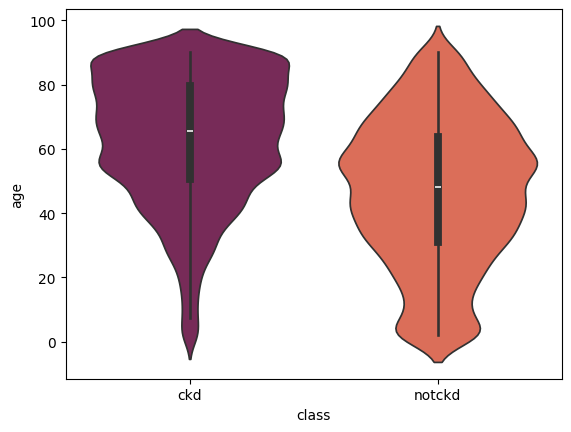

In [ ]:
sns.violinplot(x='class', y='age', hue='class', data=data, palette='rocket')

<Axes: xlabel='hypertension', ylabel='age'>

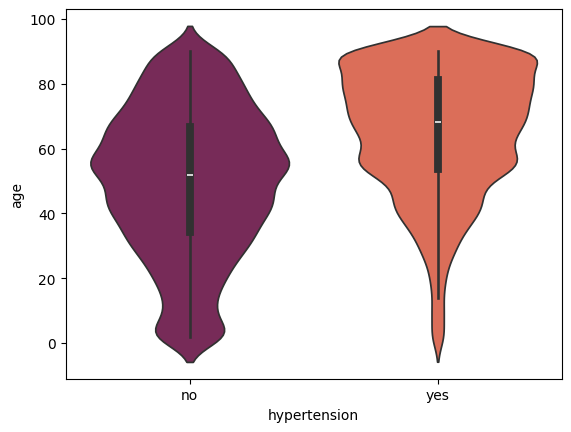

In [ ]:
sns.violinplot(x='hypertension', y='age', hue='hypertension', data=data, palette='rocket')

In [ ]:
#Correcting Values in coronary_artery_disease:
data['coronary_artery_disease'] = data['coronary_artery_disease'].replace(to_replace='\tno', value='no')
#Correcting Values in diabetes_mellitus:
data.diabetes_mellitus.replace(to_replace={'\tno': 'no', '\tyes': 'yes', ' yes': 'yes'}, inplace=True)

<Axes: xlabel='coronary_artery_disease', ylabel='age'>

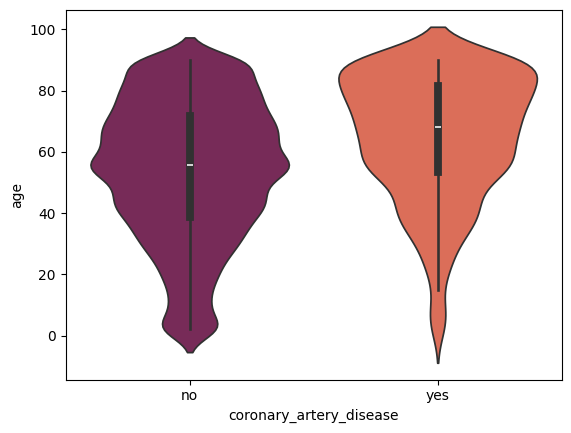

In [ ]:
sns.violinplot(x='coronary_artery_disease', y='age',hue= 'coronary_artery_disease', data=data, palette='rocket')

<Axes: xlabel='diabetes_mellitus', ylabel='age'>

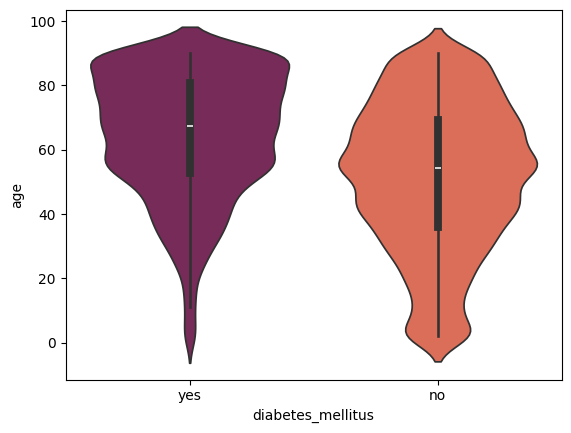

In [ ]:
sns.violinplot(x='diabetes_mellitus', y='age',hue='diabetes_mellitus', data=data, palette='rocket')

In [ ]:
cat_cols = [col for col in data.columns if data[col].dtype == 'object']

In [ ]:
num_cols = [col for col in data.columns if data[col].dtype != 'object']

In [ ]:
for col in cat_cols:
    print(f"{col} has {data[col].unique()} values\n")

red_blood_cells has ['abnormal' 'normal'] values

pus_cell has ['normal' 'abnormal'] values

pus_cell_clumps has ['notpresent' 'present'] values

bacteria has ['present' 'notpresent'] values

hypertension has ['no' 'yes'] values

diabetes_mellitus has ['yes' 'no'] values

coronary_artery_disease has ['no' 'yes'] values

appetite has ['poor' 'good'] values

pedal_edema has ['yes' 'no'] values

anemia has ['no' 'yes'] values

class has ['ckd' 'notckd'] values



In [ ]:
#Correcting Values in class:
data['class'] = data['class'].replace(to_replace={'ckd\t': 'ckd', 'notckd': 'not ckd'})

In [ ]:
data['class'] = data['class'].map({'ckd': 0, 'not ckd': 1})

In [ ]:
data['class'] = pd.to_numeric(data['class'], errors='coerce')

In [ ]:
cols = ['diabetes_mellitus', 'coronary_artery_disease', 'class']

In [ ]:
for col in cols:
    print(f"{col} has {data[col].unique()} values\n")

diabetes_mellitus has ['yes' 'no'] values

coronary_artery_disease has ['no' 'yes'] values

class has [0 1] values



In [ ]:
'''# Handle missing values
for col in data.columns:
    if data[col].dtype == "object":
        data[col].fillna(data[col].mode()[0], inplace=True)
    else:
        data[col].fillna(data[col].mean(), inplace=True)

# Label encoding for categorical variables
categorical_cols = data.select_dtypes(include=["object"]).columns
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
########################################################################

SyntaxError: incomplete input (<ipython-input-32-81191623894c>, line 1)

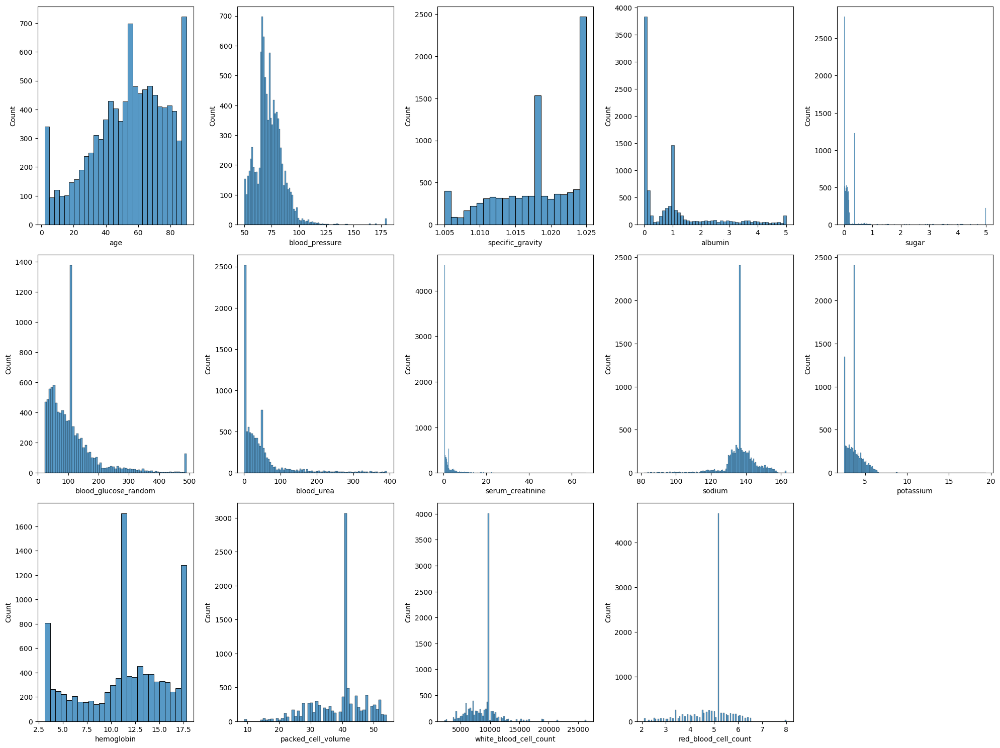

In [ ]:
plt.figure(figsize = (20, 15))
plotnumber = 1

for column in num_cols:
    if plotnumber <= 14:
        ax = plt.subplot(3, 5, plotnumber)
        sns.histplot(data[column])
        plt.xlabel(column)

    plotnumber += 1

plt.tight_layout()
plt.show()

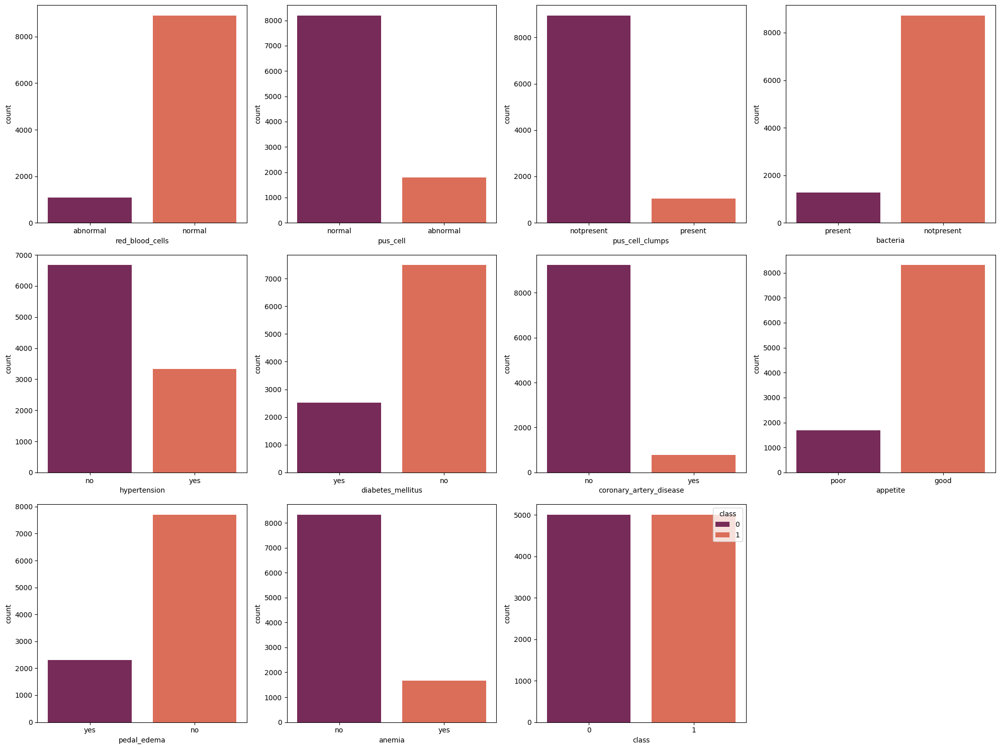

In [ ]:
plt.figure(figsize=(20, 15))
plotnumber = 1
for column in cat_cols:
    if plotnumber <= 11:
        ax = plt.subplot(3, 4, plotnumber)
        sns.countplot(x=data[column],hue=data[column] , palette='rocket')
        plt.xlabel(column)

    plotnumber += 1
plt.tight_layout()
plt.show()


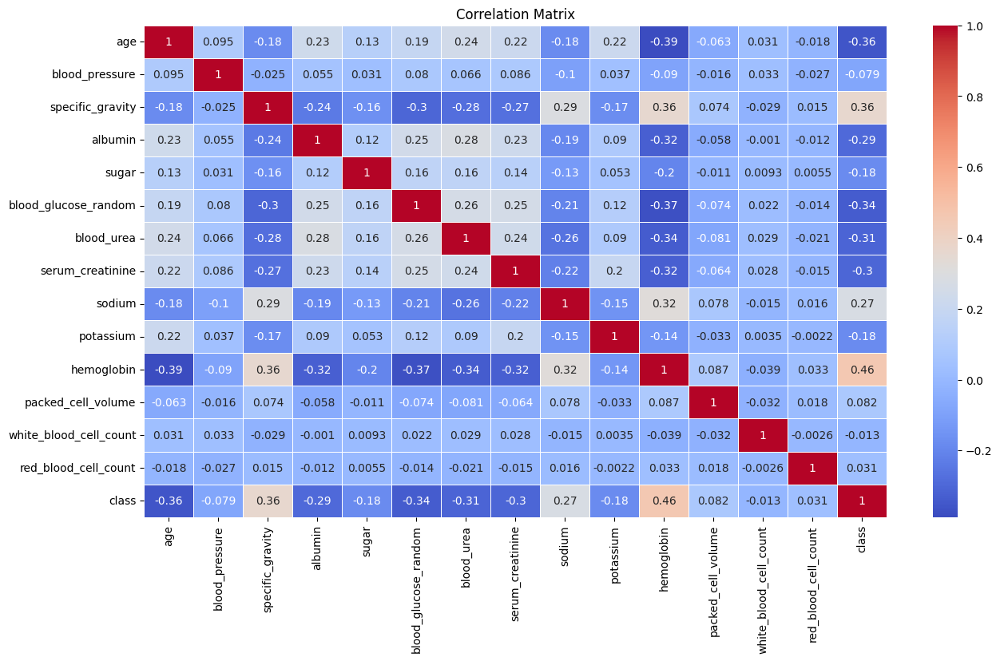

In [ ]:
import matplotlib.pyplot as plt
plt.close("all")  # Close any previous figures

# Heatmap of Correlations
plt.figure(figsize=(15, 8))
sns.heatmap(data.corr(numeric_only=True), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Matrix")
plt.show()

Text(0.5, 1.0, 'KDE Plot of Age')

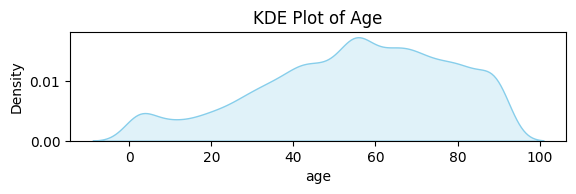

In [ ]:
plt.subplot(3, 1, 1)
sns.kdeplot(data['age'], fill=True, color='skyblue')
plt.title("KDE Plot of Age")

Text(0.5, 1.0, 'Violin Plot of Hemoglobin vs Hypertension')

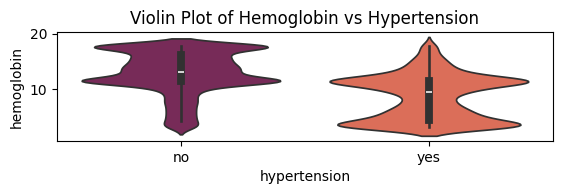

In [ ]:
plt.subplot(3, 1, 2)
sns.violinplot(x='hypertension', y='hemoglobin',hue='hypertension', data=data, palette='rocket')
plt.title("Violin Plot of Hemoglobin vs Hypertension")


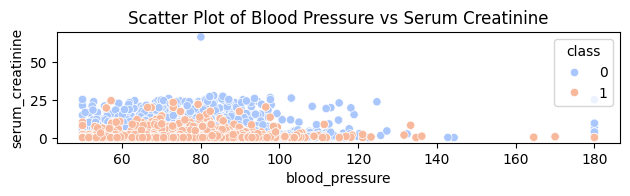

In [ ]:
#Scatter Plot of blood_pressure vs. serum_creatinine
plt.subplot(3, 1, 3)
sns.scatterplot(x='blood_pressure', y='serum_creatinine', hue='class', data=data, palette='coolwarm')
plt.title("Scatter Plot of Blood Pressure vs Serum Creatinine")
plt.tight_layout()
plt.show()

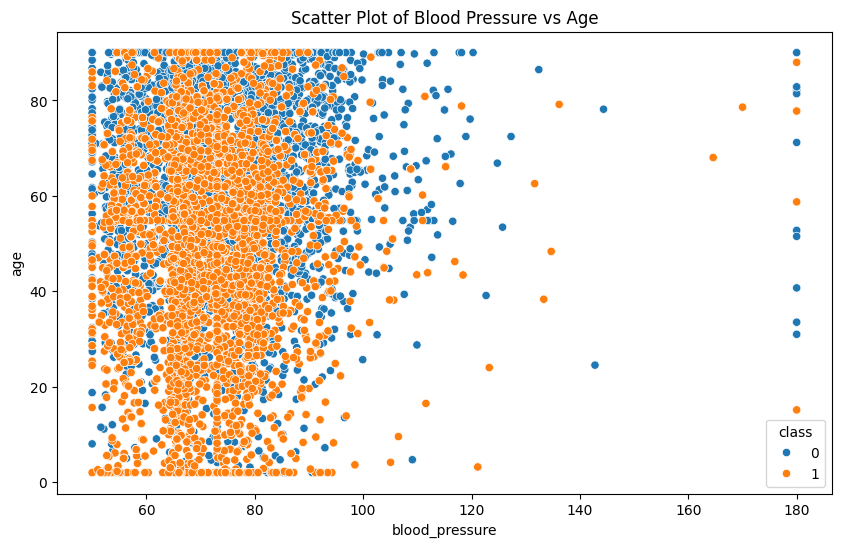

In [ ]:
#Scatter Plot of blood_pressure vs. age by class
plt.figure(figsize=(10, 6))
sns.scatterplot(x='blood_pressure', y='age', hue='class', data=data)
plt.title("Scatter Plot of Blood Pressure vs Age")
plt.show()

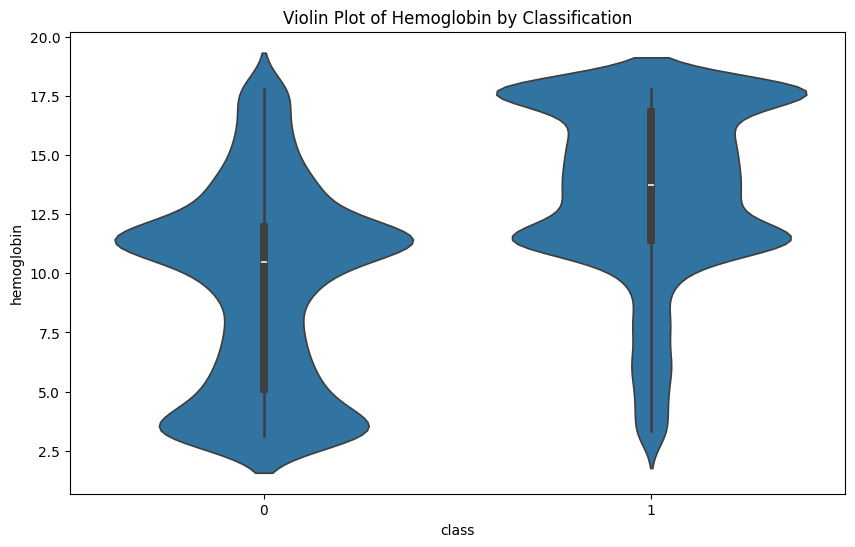

In [ ]:
#Violin Plot of hemoglobin by class
plt.figure(figsize=(10, 6))
sns.violinplot(x='class', y='hemoglobin', data=data)
plt.title("Violin Plot of Hemoglobin by Classification")
plt.show()

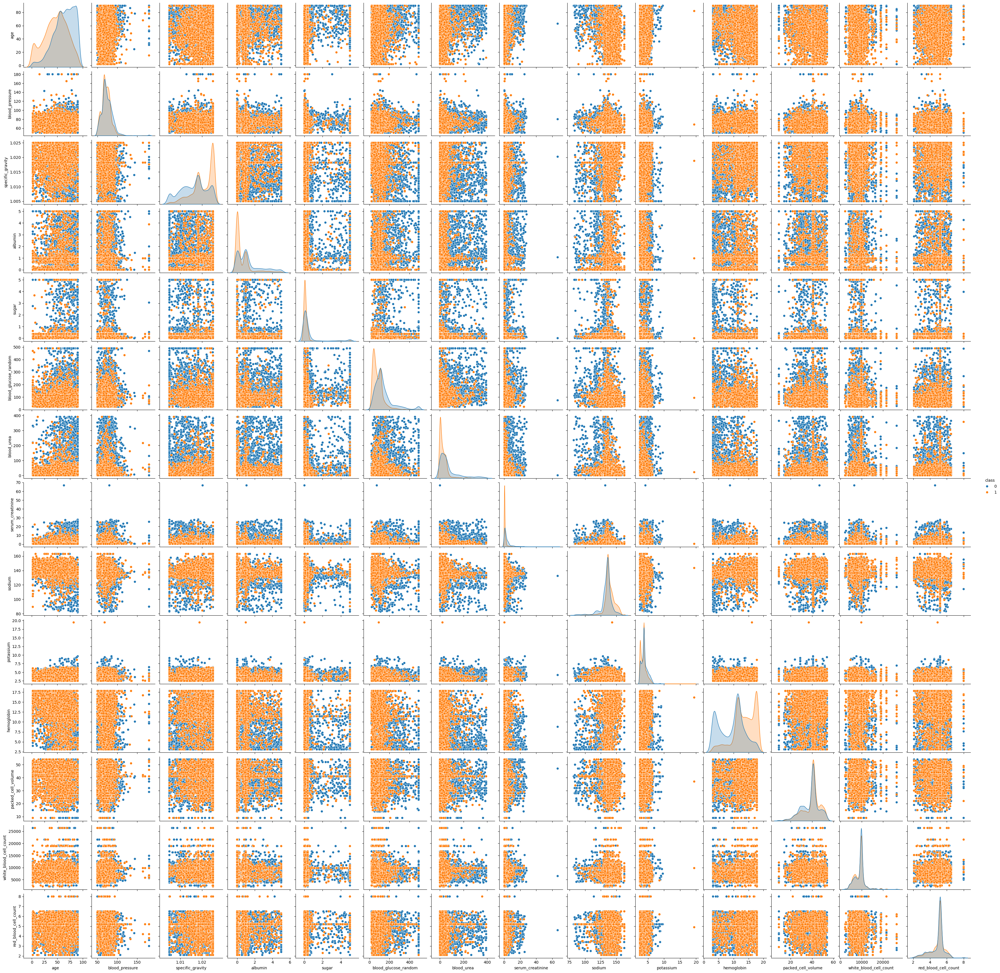

In [ ]:
#Pair Plot
sns.pairplot(data, hue='class', diag_kind='kde')
plt.show()

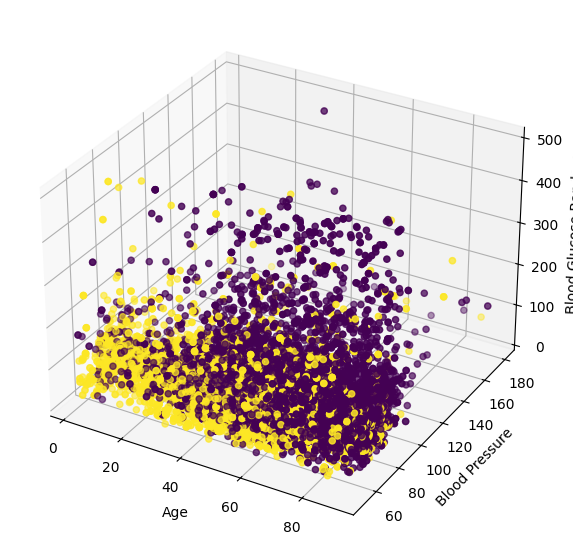

In [ ]:
#3D Scatter Plot
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(data['age'], data['blood_pressure'], data['blood_glucose_random'], c=pd.factorize(data['class'])[0], cmap='viridis')
ax.set_xlabel('Age')
ax.set_ylabel('Blood Pressure')
ax.set_zlabel('Blood Glucose Random')
plt.show()

In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for col in cat_cols:
    data[col] = le.fit_transform(data[col])
data.head()

,age,blood_pressure,specific_gravity,albumin,sugar,red_blood_cells,pus_cell,pus_cell_clumps,bacteria,blood_glucose_random,...,packed_cell_volume,white_blood_cell_count,red_blood_cell_count,hypertension,diabetes_mellitus,coronary_artery_disease,appetite,pedal_edema,anemia,class
0,54.809116,56.518561,1.016291,0.000000,1.923205,0,1,0,1,68.482424,...,53.0,9900.0,5.2,0,1,0,1,1,0,0
1,80.878548,68.241754,1.018162,2.526173,1.908239,1,1,0,0,109.044106,...,20.0,9800.0,5.2,0,1,0,1,1,0,0
2,82.263925,64.334385,1.005000,4.125700,0.000000,1,1,0,0,128.460760,...,32.0,7200.0,5.2,1,0,0,0,0,0,0
3,62.463738,58.166452,1.008420,0.833084,3.640488,0,0,1,0,111.350385,...,40.0,9800.0,5.2,0,0,0,0,1,0,0
4,69.638772,89.979287,1.016896,3.147144,0.133488,1,0,0,1,111.350385,...,24.0,8800.0,6.0,0,0,1,0,1,1,0


In [ ]:
# Feature and target separation again
#data = data.dropna(subset=["class"])
#data["class"].fillna(data["class"].mode()[0], inplace=True)
X = data.drop(columns=["class"])
y = data["class"]

X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.4, random_state=42, stratify=y
)
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp
)




In [ ]:
# Print the dataset sizes
print(f"Training set: {X_train.shape}, {y_train.shape}")
print(f"Validation set: {X_val.shape}, {y_val.shape}")
print(f"Test set: {X_test.shape}, {y_test.shape}")

Training set: (6000, 24), (6000,)
Validation set: (2000, 24), (2000,)
Test set: (2000, 24), (2000,)


In [ ]:
# Fill numerical columns with median
X_train.fillna(X_train.median(), inplace=True)
X_val.fillna(X_train.median(), inplace=True)  # Use X_train stats to avoid leakage
X_test.fillna(X_train.median(), inplace=True)
# Fill categorical columns with mode
for col in X_train.select_dtypes(include=['object']).columns:
    X_train[col].fillna(X_train[col].mode()[0], inplace=True)
    X_val[col].fillna(X_train[col].mode()[0], inplace=True)
    X_test[col].fillna(X_train[col].mode()[0], inplace=True)


# Feature weighting based on Random Forest importance
rf_model = RandomForestClassifier(random_state=42).fit(X_train, y_train)
feature_weights = rf_model.feature_importances_ / rf_model.feature_importances_.sum()
X_train_weighted = X_train.copy()
X_val_weighted = X_val.copy()
X_test_weighted = X_test.copy()
for i, col in enumerate(X_train.columns):
    X_train_weighted[col] *= feature_weights[i]
    X_val_weighted[col] *= feature_weights[i]
    X_test_weighted[col] *= feature_weights[i]

# Top-3 features based on accuracy
def select_top_k_features(X, y, k, model):
    feature_scores = {}
    for feature in X.columns:
        X_single = X[[feature]]
        model_clone = clone(model)
        model_clone.fit(X_single, y)
        y_pred = model_clone.predict(X_single)
        acc = accuracy_score(y, y_pred)
        feature_scores[feature] = acc
    sorted_features = sorted(feature_scores, key=feature_scores.get, reverse=True)
    return sorted_features[:k]

# Forward selection
def forward_selection(X, y, initial_features, model):
    selected_features = list(initial_features)
    remaining_features = list(set(X.columns) - set(initial_features))
    best_accuracy = 0
    while remaining_features:
        feature_to_add = None
        for feature in remaining_features:
            current_features = selected_features + [feature]
            model_clone = clone(model)
            model_clone.fit(X[current_features], y)
            y_pred = model_clone.predict(X[current_features])
            acc = accuracy_score(y, y_pred)
            if acc > best_accuracy:
                best_accuracy = acc
                feature_to_add = feature
        if feature_to_add:
            selected_features.append(feature_to_add)
            remaining_features.remove(feature_to_add)
        else:
            break
    return selected_features


In [ ]:
# Models and parameters
models = {
    "Bagging": BaggingClassifier(estimator=DecisionTreeClassifier(), random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "AdaBoost": AdaBoostClassifier(random_state=42),
    "LightGBM": LGBMClassifier(random_state=42),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42),
    "XGBoost": XGBClassifier(eval_metric="logloss", random_state=42),
}
param_grids = {
    "Bagging": {
        "n_estimators": [10, 50, 100],
        "estimator__max_depth": [3, 5, 10],
    },
    "Gradient Boosting": {
        "n_estimators": [50, 100],
        "learning_rate": [0.05, 0.1, 0.2],
        "max_depth": [3, 5],
    },
    "AdaBoost": {
        "n_estimators": [50, 100],
        "learning_rate": [0.05, 0.1, 0.2],
    },
    "LightGBM": {
        "n_estimators": [50, 100],
        "learning_rate": [0.05, 0.1, 0.2],
        "max_depth": [3, 5],
    },
    "Random Forest": {
        "n_estimators": [50, 100],
        "max_depth": [3, 5, 10],
        "min_samples_split": [2, 5, 10],
    },
    "Decision Tree": {
        "max_depth": [3, 5, 10],
        "min_samples_split": [2, 5, 10],
    },
}

# Training and tuning models
best_estimators = {}
selected_features_per_model = {}
for model_name, model in models.items():
    try:
        top_3_features = select_top_k_features(X_train_weighted, y_train, 3, model)
        selected_features = forward_selection(X_train_weighted, y_train, top_3_features, model)
        X_train_selected = X_train_weighted[selected_features]
        X_val_selected = X_val_weighted[selected_features]
        if model_name in param_grids:
            grid_search = GridSearchCV(model, param_grids[model_name], cv=3, scoring="accuracy", n_jobs=-1)
            grid_search.fit(X_train_selected, y_train)
            best_estimators[model_name] = grid_search.best_estimator_
        else:
            model.fit(X_train_selected, y_train)
            best_estimators[model_name] = model
        selected_features_per_model[model_name] = selected_features
    except Exception as e:
        print(f"Error with {model_name}: {e}")

from sklearn.model_selection import cross_val_score

# Function to perform k-fold cross-validation for all models
def k_fold_validation(models, X, y, cv=5):
    results = {}
    for name, model in models.items():
        try:
            scores = cross_val_score(model, X, y, cv=cv, scoring='accuracy', n_jobs=-1)
            results[name] = {
                "Mean Accuracy": scores.mean(),
                "Standard Deviation": scores.std()
            }
            print(f"{name}: Mean Accuracy = {scores.mean():.4f}, Std = {scores.std():.4f}")
        except Exception as e:
            print(f"Error with {name}: {e}")
    return results

# Run k-fold cross-validation on all trained models
cv_results = k_fold_validation(best_estimators, X_train_weighted, y_train, cv=5)


[LightGBM] [Info] Number of positive: 3000, number of negative: 3000
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 6000, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 3000, number of negative: 3000
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000096 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 6000, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 3000, number of negative: 3000
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the o

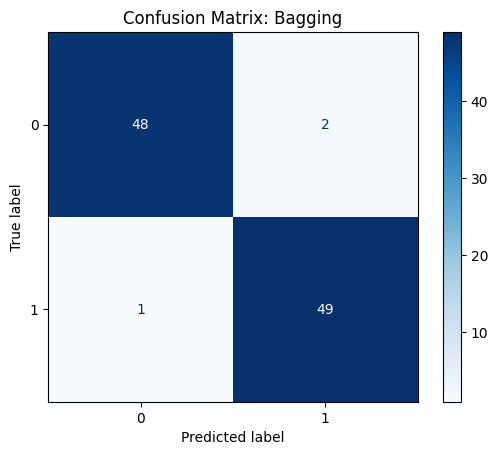

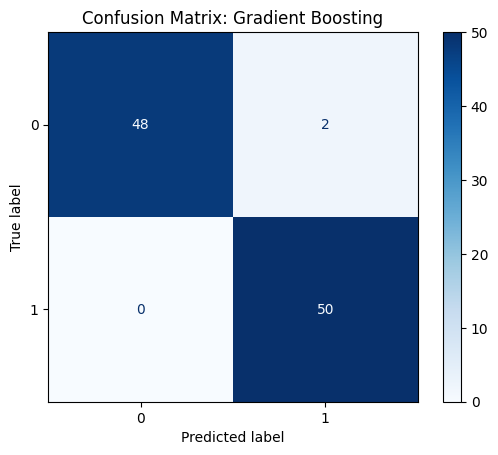

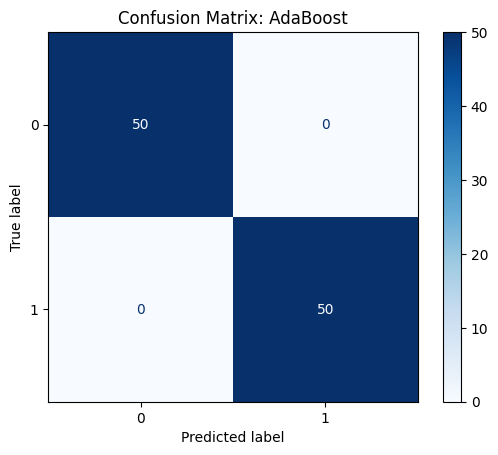

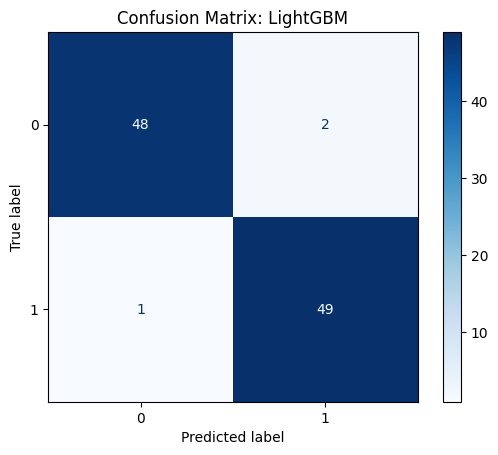

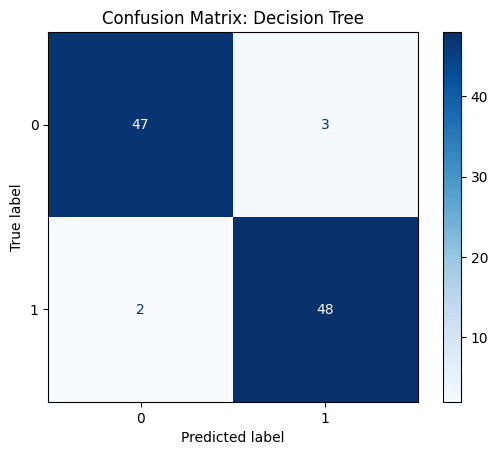

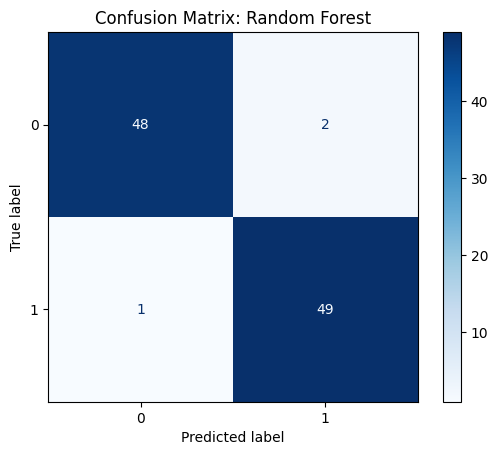

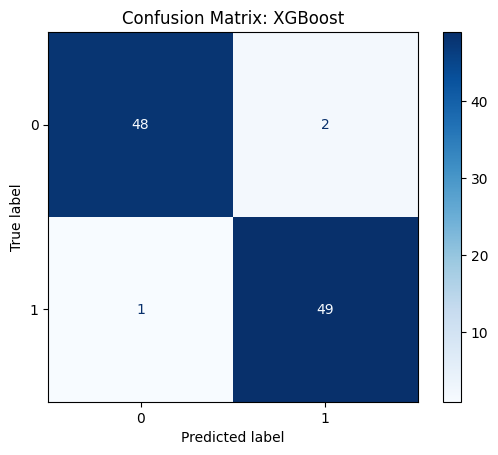

In [ ]:
# Stacking model

stacking_estimators = [
    ("bagging", best_estimators["Bagging"]),
    ("gradient_boosting", best_estimators["Gradient Boosting"]),
    ("adaboost", best_estimators["AdaBoost"]),
    ("lightgbm", best_estimators["LightGBM"]),
    ("random_forest", best_estimators["Random Forest"]),
    ("xgboost", best_estimators["XGBoost"]),
    #("xgboost", XGBClassifier(use_label_encoder=False, eval_metric="logloss")),
    ]
stacking_model = StackingClassifier(
    estimators=stacking_estimators,
    final_estimator=LogisticRegression(),
    passthrough=True,
    cv=5,
    n_jobs=-1,
)
stacking_model.fit(X_train_weighted, y_train)

# Evaluate models with confusion matrices

def evaluate_and_plot_confusion_matrix(model, X_val, y_val, model_name):
    y_pred = model.predict(X_val)
    y_pred_proba = model.predict_proba(X_val)[:, 1] if hasattr(model, "predict_proba") else None
    accuracy = accuracy_score(y_val, y_pred)
    precision = precision_score(y_val, y_pred)
    recall = recall_score(y_val, y_pred)
    f1 = f1_score(y_val, y_pred)
    roc_auc = roc_auc_score(y_val, y_pred_proba) if y_pred_proba is not None else "N/A"

    # Plot confusion matrix
    cm = confusion_matrix(y_val, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y_val))
    disp.plot(cmap='Blues', values_format='d')
    plt.title(f'Confusion Matrix: {model_name}')
    plt.show()

    return accuracy, precision, recall, f1, roc_auc
evaluation_results = []
for model_name, model in best_estimators.items():
    try:
        acc, precision, recall, f1, roc_auc = evaluate_and_plot_confusion_matrix(
            model,
            X_val_weighted[selected_features_per_model[model_name]],
            y_val,
            model_name,
        )
        evaluation_results.append({
            "Model": model_name,
            "Accuracy": acc,
            "Precision": precision,
            "Recall": recall,
            "F1-Score": f1,
            "ROC-AUC": roc_auc,
        })
    except Exception as e:
        print(f"Error evaluating {model_name}: {e}")


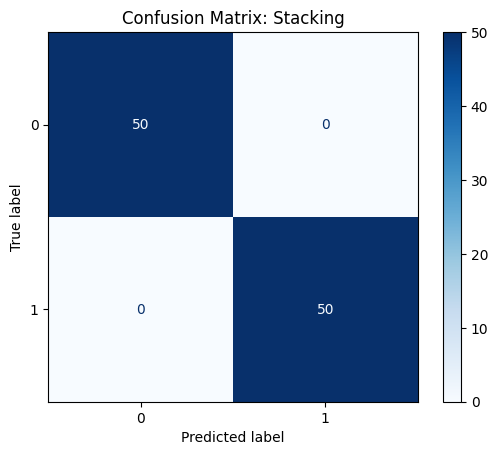

+----+--------+-------------------+------------+-------------+----------+------------+-----------+
|    |   Rank | Model             |   Accuracy |   Precision |   Recall |   F1-Score |   ROC-AUC |
+====+========+===================+============+=============+==========+============+===========+
|  0 |      1 | AdaBoost          |       1    |    1        |     1    |   1        |    1      |
+----+--------+-------------------+------------+-------------+----------+------------+-----------+
|  1 |      2 | Stacking          |       1    |    1        |     1    |   1        |    1      |
+----+--------+-------------------+------------+-------------+----------+------------+-----------+
|  2 |      3 | Gradient Boosting |       0.98 |    0.961538 |     1    |   0.980392 |    1      |
+----+--------+-------------------+------------+-------------+----------+------------+-----------+
|  3 |      4 | Bagging           |       0.97 |    0.960784 |     0.98 |   0.970297 |    0.9852 |
+----+----

In [ ]:
# Stacking evaluation
stacking_acc, stacking_precision, stacking_recall, stacking_f1, stacking_roc_auc = evaluate_and_plot_confusion_matrix(
    stacking_model, X_val_weighted, y_val, "Stacking"
)
evaluation_results.append({
    "Model": "Stacking",
    "Accuracy": stacking_acc,
    "Precision": stacking_precision,
    "Recall": stacking_recall,
    "F1-Score": stacking_f1,
    "ROC-AUC": stacking_roc_auc,
})

# Create a DataFrame for evaluation results
results_df = pd.DataFrame(evaluation_results)

# Sort the DataFrame by Accuracy in descending order
results_df = results_df.sort_values(by="Accuracy", ascending=False).reset_index(drop=True)

# Add a rank column with ascending numbers
results_df.insert(0, "Rank", range(1, len(results_df) + 1))

# Display the updated table
print(tabulate(results_df, headers="keys", tablefmt="grid"))

# Find the best performing model based on accuracy
best_model = results_df.iloc[0]
print(f"\nBest Performing Model: {best_model['Model']} with Accuracy: {best_model['Accuracy']:.4f}")

from sklearn.model_selection import cross_val_score

cv_scores = cross_val_score(model, X, y, cv=5, scoring='accuracy')

print(f"Cross-validation accuracy scores: {cv_scores}")
print(f"Mean accuracy: {cv_scores.mean():.4f}")
print(f"Standard deviation: {cv_scores.std():.4f}")

# If accuracy varies greatly across folds, overfitting might be occurring.


In [ ]:
import matplotlib.pyplot as plt
plt.close("all")  # Close any previous figures